<a href="https://colab.research.google.com/github/jeoaraujx/TCC/blob/master/Pipeline_BERTOPIC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## BERTopic TCC


### Instalação de Pacotes e Dependências

Este bloco de código instala as bibliotecas Python necessárias para o pipeline de Modelagem de Tópicos com BERTopic. Ele garante que todas as dependências estejam disponíveis antes de executar o restante do código.

In [ ]:
# ==========================================
# PASSO 1: LIMPEZA DO AMBIENTE
# ==========================================
print("🧹 Limpando ambiente...")
!pip uninstall -y umap-learn hdbscan bertopic scikit-learn numpy sentence-transformers langdetect wordcloud gensim -qq

# ==========================================
# PASSO 2: INSTALAÇÃO SINCRONIZADA (COMPLETA)
# ==========================================
# Instala as versões compatíveis (numpy antigo, sklearn 1.5.2) + as libs que faltaram (langdetect, wordcloud, gensim)
print("⬇️ Instalando dependências completas...")
!pip install "numpy<2.0" "scikit-learn==1.5.2" "umap-learn==0.5.6" "hdbscan==0.8.33" "bertopic==0.16.0" "sentence-transformers" "langdetect" "wordcloud" "gensim" "plotly" "wizmap" "tqdm" "nltk" "spacy==3.7.5" -qq

# ==========================================
# PASSO 3: SETUP FINAL
# ==========================================
print("📥 Baixando modelos de linguagem...")
!pip install jedi>=0.16 -qq
!python -m spacy download pt_core_news_sm -qq
!python -m spacy download en_core_web_sm -qq

print("\n✅ INSTALAÇÃO CONCLUÍDA! Todas as bibliotecas estão presentes.")
print("⚠️ IMPORTANTE: Vá em 'Runtime' > 'Restart Session' (Reiniciar Sessão) agora!")

🧹 Limpando ambiente...
⬇️ Instalando dependências completas...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 79.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 70.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 104.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Todos os imports do projeto

In [ ]:
import numpy as np
import os
from wordcloud import WordCloud
import pandas as pd
import seaborn as sns
import re
import ast
import spacy
import nltk
from nltk.corpus import stopwords
from tqdm import tqdm
from langdetect import detect
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance
import umap
import hdbscan
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
import itertools
import unicodedata
import matplotlib.pyplot as plt
from os.path import join
from wizmap import wizmap
import warnings

### Pipeline Completo BERTopic

Após a validação dos parâmetros ideais para UMAP e HDBSCAN através dos grid searches, este bloco de código monta o pipeline completo do BERTopic. Ele carrega os dados pré-processados e embeddings gerados anteriormente, configura o modelo BERTopic com os parâmetros otimizados e treina o modelo para extrair tópicos.

1. **Carregamento de dados:** Carrega os textos pré-processados e seus embeddings.
2. **Configuração de modelos:** Inicializa o modelo de embeddings, o modelo UMAP com os melhores parâmetros encontrados no grid search anterior, o modelo HDBSCAN com os melhores parâmetros encontrados no grid search, e o modelo de representação MMR.
3. **Criação do modelo BERTopic:** Instancia o objeto BERTopic com os modelos configurados.
4. **Treinamento do modelo:** Treina o modelo BERTopic utilizando os textos e embeddings.
5. **Salvamento do modelo:** Salva o modelo treinado para uso posterior.

#### Refatoração de código

In [ ]:
# Ignorar avisos não críticos para limpar a saída
warnings.filterwarnings("ignore")

class TopicModelingPipeline:
    def __init__(self, config):
        """
        Inicializa o pipeline com as configurações necessárias.
        Args:
            config (dict): Dicionário contendo caminhos e hiperparâmetros.
        """
        self.config = config
        self.df = None
        self.embeddings = None
        self.topic_model = None

        # Setup de diretórios
        os.makedirs(os.path.dirname(self.config['processed_path']), exist_ok=True)

        # Setup de NLP (Executado apenas uma vez)
        print("🛠️ Inicializando recursos de NLP...")
        nltk.download('stopwords', quiet=True)
        nltk.download('punkt', quiet=True)
        try:
            self.nlp_pt = spacy.load("pt_core_news_sm")
            self.nlp_en = spacy.load("en_core_web_sm")
        except OSError:
            print("⚠️ Modelos Spacy não encontrados. Tentando baixar...")
            os.system("python -m spacy download pt_core_news_sm")
            os.system("python -m spacy download en_core_web_sm")
            self.nlp_pt = spacy.load("pt_core_news_sm")
            self.nlp_en = spacy.load("en_core_web_sm")

    def _normalize_text(self, text):
        """Normaliza acentos e remove caracteres estranhos."""
        text = str(text).lower()
        text = unicodedata.normalize("NFKD", text)
        text = text.encode("ascii", "ignore").decode("utf-8")
        text = re.sub(r"[^a-z\s]", " ", text)
        text = re.sub(r"\s+", " ", text).strip()
        return text

    def _preprocess_text_bilingual(self, text):
        """Processamento bilíngue: detecta idioma, remove stopwords e lematiza."""
        if pd.isna(text) or text.strip() == "":
            return ""

        stopwords_pt = set(stopwords.words('portuguese'))
        stopwords_en = set(stopwords.words('english'))

        try:
            lang = detect(text)
        except:
            lang = "pt"

        text = self._normalize_text(text)

        if lang == 'en':
            doc = self.nlp_en(text)
            stopwords_set = stopwords_en
        else:
            doc = self.nlp_pt(text)
            stopwords_set = stopwords_pt

        tokens = []
        for token in doc:
            lemma = token.lemma_.lower().strip()
            if (len(lemma) < 3 or lemma in stopwords_set or token.is_punct or token.is_space):
                continue
            tokens.append(lemma)

        return " ".join(list(dict.fromkeys(tokens)))

    def load_and_preprocess(self, force_process=False):
        """Carrega dados e executa pré-processamento se necessário."""
        if not force_process and os.path.exists(self.config['processed_path']):
            print(f"📂 Carregando dados pré-processados de: {self.config['processed_path']}")
            self.df = pd.read_csv(self.config['processed_path'])
            # Garantir limpeza de nulos
            self.df = self.df[self.df['title_processed'].notna()].reset_index(drop=True)
        else:
            print("🔄 Iniciando pré-processamento dos dados brutos...")
            if not os.path.exists(self.config['raw_path']):
                raise FileNotFoundError(f"Arquivo bruto não encontrado: {self.config['raw_path']}")

            df_raw = pd.read_csv(self.config['raw_path'])
            df_raw = df_raw.rename(columns={'title': 'title_original'})

            # Limpeza inicial
            df_raw = df_raw[df_raw['title_original'].notna() & (df_raw['title_original'].str.strip().str.len() > 0)]
            df_raw = df_raw.drop_duplicates(subset=['title_original']).reset_index(drop=True)

            tqdm.pandas(desc="Processando textos")
            df_raw['title_processed'] = df_raw['title_original'].progress_apply(self._preprocess_text_bilingual)

            self.df = df_raw[df_raw['title_processed'].str.len() > 0].reset_index(drop=True)
            self.df.to_csv(self.config['processed_path'], index=False)
            print(f"✅ Dados processados salvos em: {self.config['processed_path']}")

    def generate_embeddings(self, force_new=False):
        """Gera ou carrega embeddings."""
        if self.df is None:
            raise ValueError("Dataframe não carregado. Execute load_and_preprocess primeiro.")

        if not force_new and os.path.exists(self.config['embeddings_path']):
            print(f"📂 Carregando embeddings existentes de: {self.config['embeddings_path']}")
            self.embeddings = np.load(self.config['embeddings_path'])

            # Check de consistência
            if len(self.embeddings) != len(self.df):
                print("⚠️ Aviso: Tamanho dos embeddings difere do DF. Regenerando...")
                self.generate_embeddings(force_new=True)
        else:
            print("🧠 Gerando novos embeddings...")
            embedder = SentenceTransformer(self.config['embedding_model'])
            tqdm.pandas(desc="Encoding")
            embeddings_series = self.df['title_processed'].progress_apply(
                lambda x: embedder.encode(x, show_progress_bar=False)
            )
            self.embeddings = np.vstack(embeddings_series.to_numpy())
            np.save(self.config['embeddings_path'], self.embeddings)
            print(f"✅ Embeddings salvos (Shape: {self.embeddings.shape})")

    def run_topic_model(self, train_new=True, use_mmr=False, diversity=0.3):
        """Treina ou carrega o modelo BERTopic."""
        model_path = self.config['model_path']

        if not train_new:
            try:
                print(f"📂 Carregando modelo BERTopic de: {model_path}")
                self.topic_model = BERTopic.load(model_path)
                # Opcional: transformar apenas para obter tópicos/probs atuais
                # topics, probs = self.topic_model.transform(self.df['title_processed'].tolist(), self.embeddings)
            except Exception as e:
                print(f"❌ Erro ao carregar modelo ({e}). Treinando um novo...")
                self.run_topic_model(train_new=True)
        else:
            print("🚀 Treinando modelo BERTopic...")

            # Configuração UMAP
            umap_model = umap.UMAP(
                n_neighbors=self.config['n_neighbors'], n_components=self.config['n_components'], min_dist=self.config['min_dist'],
                metric=self.config['metric'], random_state=self.config['random_state']
            )

            # Configuração HDBSCAN
            hdbscan_model = hdbscan.HDBSCAN(
                min_cluster_size=self.config['min_cluster_size'],
                min_samples=self.config['min_samples'], metric="euclidean",
                cluster_selection_method="eom", prediction_data=True
            )

            embedder = SentenceTransformer(self.config['embedding_model'])

            # Lógica de Comparação
            if use_mmr:
                representation_model = MaximalMarginalRelevance(diversity=diversity)
            else:
                representation_model = None # Usa o padrão c-TF-IDF

            self.topic_model = BERTopic(
                embedding_model=embedder,
                umap_model=umap_model,
                hdbscan_model=hdbscan_model,
                representation_model=representation_model,
                calculate_probabilities=True,
                verbose=True,
                language="multilingual"
            )

            topics, probs = self.topic_model.fit_transform(
                self.df['title_processed'].tolist(),
                embeddings=self.embeddings
            )

            self.topic_model.save(model_path)
            print(f"✅ Modelo treinado e salvo em: {model_path}")

            # Exibir info básica
            print(self.topic_model.get_topic_info().head(10))

    def run(self, preprocess=False, new_embeddings=False, train_model=True, use_mmr=False, diversity=0.3):
        """
        MÉTODO PRINCIPAL: Executa o pipeline completo.
        """
        print("="*40)
        print("  INICIANDO PIPELINE DE TÓPICOS  ")
        print("="*40)

        self.load_and_preprocess(force_process=preprocess)
        self.generate_embeddings(force_new=new_embeddings)
        self.run_topic_model(train_new=train_model, use_mmr=use_mmr, diversity=diversity)

        print("\n✅ Pipeline finalizado com sucesso!")
        return self.topic_model, self.df



In [ ]:
# 1. Defina seus parâmetros e caminhos
config_params = {
    # Caminhos
    'raw_path': "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_database.csv",
    'processed_path': "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_processed_texts.csv",
    'embeddings_path': "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_embeddings.npy",
    'model_path': "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model",

    # Hiperparâmetros
    'embedding_model': "paraphrase-multilingual-MiniLM-L12-v2",
    'min_cluster_size': 8, # Definitivo
    'min_samples': 2,
    'n_neighbors': 5,
    'n_components': 2,
    'min_dist': 0.0,
    'metric': "cosine",
    'random_state': 42
}

# 2. Instancie o Pipeline
pipeline = TopicModelingPipeline(config_params)


# 3. Execute! (Aqui você controla o que quer rodar)

# PASSO CRÍTICO: CARREGAR DADOS ANTES DE TREINAR
print("📥 Carregando dados para análise...")
pipeline.run(preprocess=False, new_embeddings=False, train_model=False)

# Cenário A: Rodar tudo do zero (pré-processar, gerar embeddings, treinar)
# model, df_final = pipeline.run(preprocess=True, new_embeddings=True, train_model=True)

# Cenário B: Já processou os dados e embeddings, quer apenas retreinar o BERTopic (ajuste fino)
# model, df_final = pipeline.run(preprocess=False, new_embeddings=False, train_model=True)

# Cenário C: Apenas carregar tudo que já está salvo para análise
# model, df_final = pipeline.run(preprocess=False, new_embeddings=False, train_model=False)

# 1. Treinar Modelo PADRÃO (Sem MMR)
print("\n--- 1. Treinando Modelo PADRÃO (c-TF-IDF puro) ---")
# Nota: O método retorna (topic_model, topics, probs) ou apenas o modelo dependendo da sua implementação anterior.
# Como sua classe salva internamente em self.topic_model, não precisamos atribuir o retorno obrigatoriamente aqui se formos usar o pipeline.topic_model depois.
pipeline.run_topic_model(train_new=True, use_mmr=False)
model_standard = pipeline.topic_model # Salvamos numa variável auxiliar

# 2. Treinar Modelo COM MMR
print("\n--- 2. Treinando Modelo COM MMR (Diversidade = 0.3) ---")
pipeline.run_topic_model(train_new=True, use_mmr=True, diversity=0.3)
model_mmr = pipeline.topic_model # O pipeline agora contém o modelo MMR

🛠️ Inicializando recursos de NLP...
📥 Carregando dados para análise...
  INICIANDO PIPELINE DE TÓPICOS  
📂 Carregando dados pré-processados de: /content/drive/MyDrive/UNEB/TCC/Pipeline/npai_processed_texts.csv
📂 Carregando embeddings existentes de: /content/drive/MyDrive/UNEB/TCC/Pipeline/npai_embeddings.npy
📂 Carregando modelo BERTopic de: /content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model

✅ Pipeline finalizado com sucesso!

--- 1. Treinando Modelo PADRÃO (c-TF-IDF puro) ---
🚀 Treinando modelo BERTopic...


2025-12-17 00:46:22,221 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-17 00:46:23,447 - BERTopic - Dimensionality - Completed ✓
2025-12-17 00:46:23,448 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-17 00:46:23,478 - BERTopic - Cluster - Completed ✓
2025-12-17 00:46:23,482 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-12-17 00:46:23,517 - BERTopic - Representation - Completed ✓
2025-12-17 00:46:23,565 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


✅ Modelo treinado e salvo em: /content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model
   Topic  Count                                        Name  \
0     -1     31                        -1_em_brasil_de_base   
1      0     31          0_brazil_energy_market_fluctuation   
2      1     30  1_inovacao_empreendedorismo_sobre_pesquisa   
3      2     27           2_soil_fractal_multifractal_suelo   
4      3     26      3_aprendizagem_ambiente_virtual_ensino   
5      4     26                 4_public_de_educacao_gestao   
6      5     24     5_computador_comunicar_sistema_utilizar   
7      6     17    6_network_synchronization_motif_semantic   
8      7     16        7_robotica_educacional_escola_makers   
9      8     13            8_pain_chronic_fibromyalgia_body   

                                                                                                       Representation  \
0                             [em, brasil, de, base, agent, brasileiro, linear, regional, espi

2025-12-17 00:46:31,541 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-17 00:46:32,701 - BERTopic - Dimensionality - Completed ✓
2025-12-17 00:46:32,703 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-17 00:46:32,750 - BERTopic - Cluster - Completed ✓
2025-12-17 00:46:32,753 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-12-17 00:46:34,057 - BERTopic - Representation - Completed ✓
2025-12-17 00:46:34,165 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


✅ Modelo treinado e salvo em: /content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model
   Topic  Count                                              Name  \
0     -1     31     -1_brasileiro_espiritualidade_chagas_judicial   
1      0     31                  0_brazil_market_ethanol_gasoline   
2      1     30   1_inovacao_empreendedorismo_pesquisa_aplicacoes   
3      2     27                  2_soil_fractal_oil_microrrelieve   
4      3     26         3_aprendizagem_virtual_blind_inteligencia   
5      4     26       4_conhecimento_academico_validacao_gerencia   
6      5     24      5_computador_sistema_computacao_conhecimento   
7      6     17  6_network_synchronization_semantic_sincronizacao   
8      7     16                   7_robotica_escola_makers_facial   
9      8     13              8_pain_chronic_fibromyalgia_postural   

                                                                                                                      Representation  \
0            

#### Tabela comparativa c_TF-IDF vs MMR

In [ ]:
# 4. Gerar a Tabela Comparativa Lado a Lado
def compare_models(model_a, model_b, top_n_topics=10):
    info_a = model_a.get_topic_info()
    info_b = model_b.get_topic_info()

    # Filtra outliers (-1)
    info_a = info_a[info_a['Topic'] != -1].head(top_n_topics)
    info_b = info_b[info_b['Topic'] != -1].head(top_n_topics)

    comparison_data = []

    # Pega o menor tamanho entre os dois para não dar erro de índice
    min_len = min(len(info_a), len(info_b))

    for i in range(min_len):
        tid_a = info_a.iloc[i]['Topic']
        tid_b = info_b.iloc[i]['Topic']

        # Pega as top 5 palavras
        words_a = ", ".join([word for word, _ in model_a.get_topic(tid_a)[:5]])
        words_b = ", ".join([word for word, _ in model_b.get_topic(tid_b)[:5]])

        comparison_data.append({
            "Topic ID": tid_a, # Assumindo IDs alinhados pela frequência
            "Freq Standard": info_a.iloc[i]['Count'],
            "Standard Keywords (Padrão)": words_a,
            "MMR Keywords (Diversificado)": words_b
        })

    return pd.DataFrame(comparison_data)

print("\n📊 TABELA COMPARATIVA (Standard vs MMR):")
df_comparison = compare_models(model_standard, model_mmr)
# Ajusta a exibição do pandas para não cortar o texto
pd.set_option('display.max_colwidth', None)
display(df_comparison)


📊 TABELA COMPARATIVA (Standard vs MMR):


,Topic ID,Freq Standard,Standard Keywords (Padrão),MMR Keywords (Diversificado)
0,0,31,"brazil, energy, market, fluctuation, ethanol","brazil, market, ethanol, gasoline, rate"
1,1,30,"inovacao, empreendedorismo, sobre, pesquisa, aplicar","inovacao, empreendedorismo, pesquisa, aplicacoes, intelectual"
2,2,27,"soil, fractal, multifractal, suelo, surface","soil, fractal, oil, microrrelieve, detection"
3,3,26,"aprendizagem, ambiente, virtual, ensino, blind","aprendizagem, virtual, blind, inteligencia, artificial"
4,4,26,"public, de, educacao, gestao, dado","conhecimento, academico, validacao, gerencia, decision"
5,5,24,"computador, comunicar, sistema, utilizar, computacao","computador, sistema, computacao, conhecimento, organizacoes"
6,6,17,"network, synchronization, motif, semantic, analise","network, synchronization, semantic, sincronizacao, protein"
7,7,16,"robotica, educacional, escola, makers, face","robotica, escola, makers, facial, protetor"
8,8,13,"pain, chronic, fibromyalgia, body, postural","pain, chronic, fibromyalgia, postural, vibration"
9,9,12,"dengue, case, fever, correlation, bahia","dengue, fever, correlation, chikungunya, transport"


#### WordClouds lado a lado MMR vs c_TF_IDF

Visualizando Tópico 3 (Educação/IA) - Note o aparecimento de 'Inteligência Artificial' no MMR:


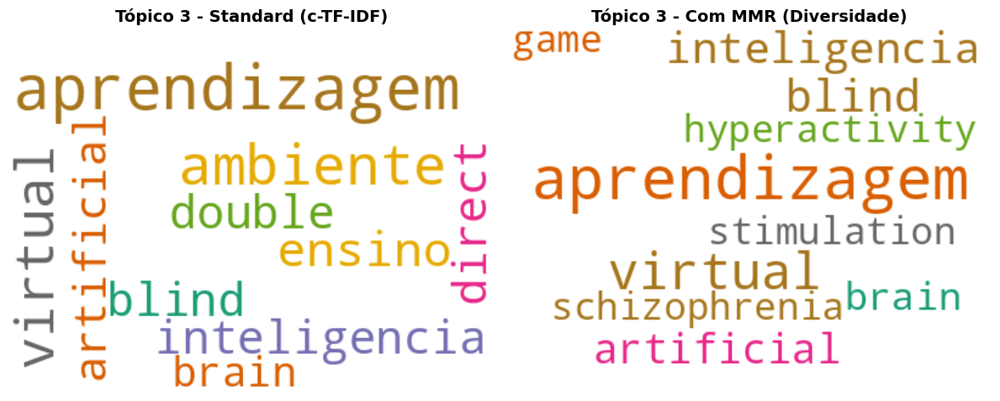


Visualizando Tópico 9 (Dengue) - Note o aparecimento de 'Chikungunya' no MMR:


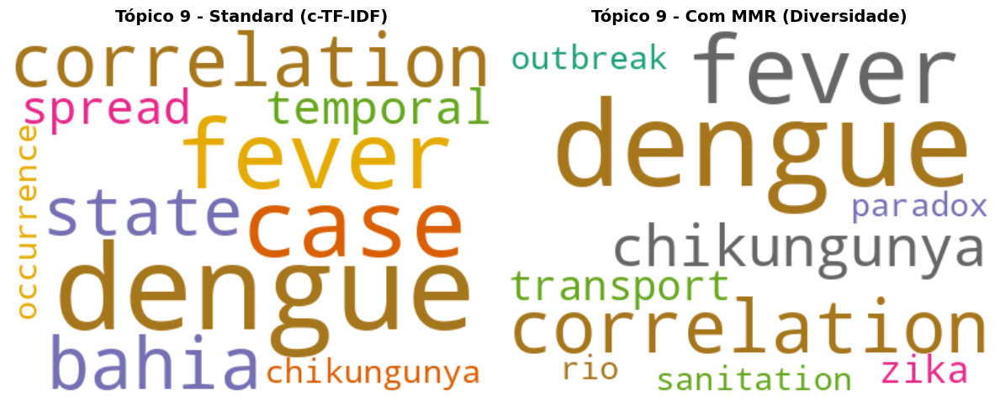


Visualizando Tópico 0 (Energia/Brasil):


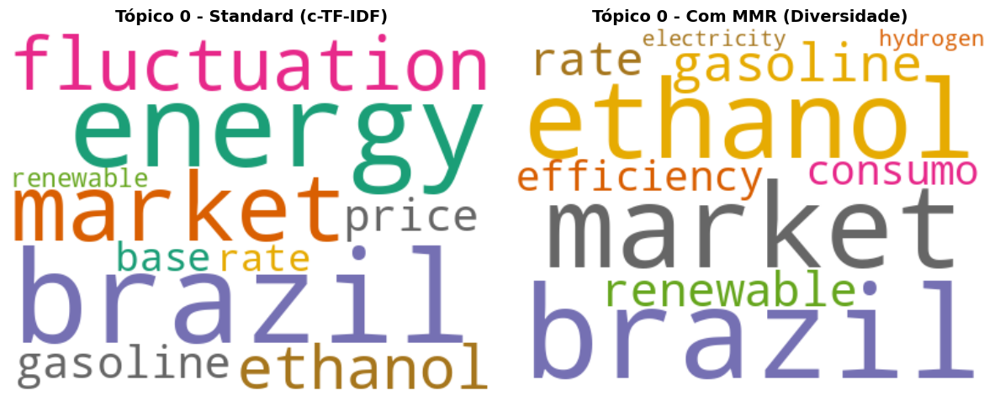

In [ ]:
def plot_dual_wordcloud(model_std, model_mmr, topic_id):
    """
    Gera duas WordClouds lado a lado: Uma para o modelo Standard e outra para o MMR.
    """
    # Configuração da WordCloud
    wc_config = {
        'background_color': 'white',
        'width': 400,
        'height': 300,
        'max_words': 10,
        'colormap': 'Dark2'
    }

    # 1. Dados do Standard
    try:
        text_std = {word: score for word, score in model_std.get_topic(topic_id)}
        wc_std = WordCloud(**wc_config).generate_from_frequencies(text_std)
    except Exception:
        print(f"Tópico {topic_id} não encontrado no Standard.")
        return

    # 2. Dados do MMR
    try:
        text_mmr = {word: score for word, score in model_mmr.get_topic(topic_id)}
        wc_mmr = WordCloud(**wc_config).generate_from_frequencies(text_mmr)
    except Exception:
        print(f"Tópico {topic_id} não encontrado no MMR.")
        return

    # Plotagem
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].imshow(wc_std, interpolation='bilinear')
    axes[0].set_title(f"Tópico {topic_id} - Standard (c-TF-IDF)", fontsize=14, fontweight='bold')
    axes[0].axis("off")

    axes[1].imshow(wc_mmr, interpolation='bilinear')
    axes[1].set_title(f"Tópico {topic_id} - Com MMR (Diversidade)", fontsize=14, fontweight='bold')
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

# --- GERAR VISUALIZAÇÕES ---

# Vamos visualizar os tópicos mais interessantes que discutimos:
print("Visualizando Tópico 3 (Educação/IA) - Note o aparecimento de 'Inteligência Artificial' no MMR:")
plot_dual_wordcloud(model_standard, model_mmr, topic_id=3)

print("\nVisualizando Tópico 9 (Dengue) - Note o aparecimento de 'Chikungunya' no MMR:")
plot_dual_wordcloud(model_standard, model_mmr, topic_id=9)

print("\nVisualizando Tópico 0 (Energia/Brasil):")
plot_dual_wordcloud(model_standard, model_mmr, topic_id=0)

#### Análise de dados para metrificar o min_cluster_size

🧪 Iniciando Grid Search para: [4, 6, 8, 10, 15, 20, 25]


Testando tamanhos: 100%|██████████| 7/7 [00:23<00:00,  3.40s/it]


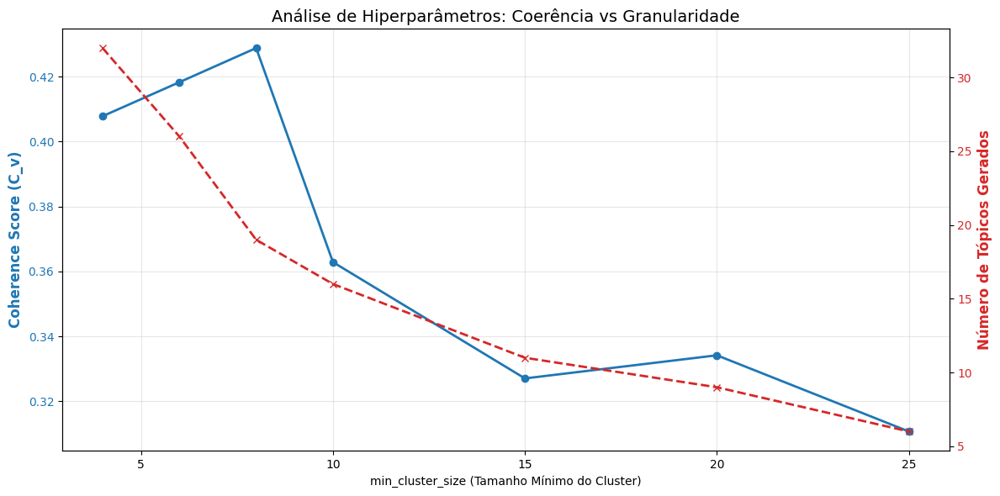

,min_cluster_size,Coherence,Num_Topics,Outliers_Perc
0,4,0.407789,32,11.953353
1,6,0.418260,26,13.702624
2,8,0.428782,19,8.746356
3,10,0.362848,16,4.081633
4,15,0.327035,11,10.495627
5,20,0.334153,9,10.495627
6,25,0.310685,6,10.204082


In [ ]:
def tune_min_cluster_size(pipeline_obj, sizes_to_test=[5, 10, 15, 20, 30]):
    """
    Testa diferentes valores de min_cluster_size usando os dados já carregados no pipeline.
    """
    print(f"🧪 Iniciando Grid Search para: {sizes_to_test}")

    df = pipeline_obj.df
    embeddings = pipeline_obj.embeddings

    # Preparar dados para o Gensim (Cálculo de Coerência)
    # Tokenização simples apenas para validar a coerência
    docs = df['title_processed'].apply(lambda x: x.split()).tolist()
    dictionary = Dictionary(docs)
    corpus = [dictionary.doc2bow(text) for text in docs]

    results = []

    for size in tqdm(sizes_to_test, desc="Testando tamanhos"):
        # 1. Configurar HDBSCAN temporário
        hdbscan_model = hdbscan.HDBSCAN(
            min_cluster_size=size,
            min_samples=pipeline_obj.config['min_samples'], # Usa o mesmo min_samples do seu config
            metric='euclidean',
            cluster_selection_method='eom',
            prediction_data=True
        )

        # 2. Treinar BERTopic Rápido (sem salvar, apenas em memória)
        topic_model = BERTopic(
            hdbscan_model=hdbscan_model,
            calculate_probabilities=False,
            verbose=False
        )
        topic_model.fit(df['title_processed'].tolist(), embeddings=embeddings)

        # 3. Extrair tópicos para coerência
        topics_data = topic_model.get_topics()
        topic_words = []

        for topic_id in topics_data:
            if topic_id == -1: continue # Ignora outliers
            words = [word for word, _ in topics_data[topic_id]]
            topic_words.append(words)

        # 4. Calcular Coerência (c_v)
        if not topic_words:
            cv_score = 0
        else:
            cm = CoherenceModel(topics=topic_words, texts=docs, corpus=corpus, dictionary=dictionary, coherence='c_v')
            cv_score = cm.get_coherence()

        # 5. Estatísticas
        freq = topic_model.get_topic_info()
        outliers = freq[freq['Topic'] == -1]['Count'].values[0] if -1 in freq['Topic'].values else 0
        total_docs = len(df)
        outlier_perc = (outliers / total_docs) * 100
        num_topics = len(freq) - 1

        results.append({
            'min_cluster_size': size,
            'Coherence': cv_score,
            'Num_Topics': num_topics,
            'Outliers_Perc': outlier_perc
        })

    results_df = pd.DataFrame(results)

    # --- PLOTAR RESULTADOS ---
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Eixo Y1: Coerência (Azul)
    color = 'tab:blue'
    ax1.set_xlabel('min_cluster_size (Tamanho Mínimo do Cluster)')
    ax1.set_ylabel('Coherence Score (C_v)', color=color, fontsize=12, fontweight='bold')
    ax1.plot(results_df['min_cluster_size'], results_df['Coherence'], marker='o', linewidth=2, color=color, label='Coerência')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    # Eixo Y2: Número de Tópicos (Vermelho)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Número de Tópicos Gerados', color=color, fontsize=12, fontweight='bold')
    ax2.plot(results_df['min_cluster_size'], results_df['Num_Topics'], marker='x', linestyle='--', linewidth=2, color=color, label='Num Tópicos')
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title('Análise de Hiperparâmetros: Coerência vs Granularidade', fontsize=14)
    fig.tight_layout()
    plt.show()

    return results_df

# Executar a análise
# Ajuste a lista sizes_to_test conforme sua necessidade
df_results = tune_min_cluster_size(pipeline, sizes_to_test=[4, 6, 8, 10, 15, 20, 25])
display(df_results)

#### Calculo de NPMI do MMR vs c_TF-IDF

🧮 Calculando NPMI (Isso pode levar alguns segundos)...
NPMI Médio (Standard): -0.0864
NPMI Médio (MMR): -0.2639


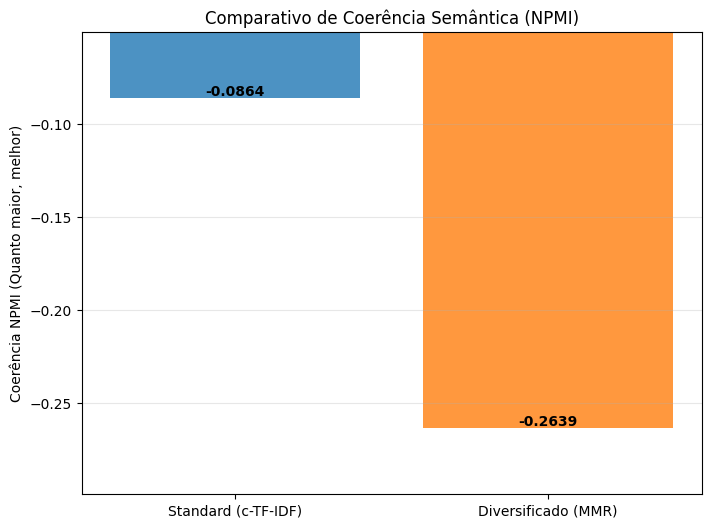

In [ ]:
def calculate_mean_npmi(topic_model, texts):
    """
    Calcula o Score NPMI médio para um modelo BERTopic.
    """
    # 1. Preparar dados para o Gensim
    # Tokenização simples
    tokens = [doc.split() for doc in texts]
    dictionary = Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]

    # 2. Extrair tópicos do BERTopic
    topics = topic_model.get_topics()
    topic_words = []

    for topic_id in topics:
        if topic_id == -1: continue # Ignora outliers
        # Pega as top 10 palavras de cada tópico
        words = [word for word, _ in topics[topic_id][:10]]
        topic_words.append(words)

    # 3. Calcular Coerência (c_npmi)
    if not topic_words:
        return 0

    cm = CoherenceModel(
        topics=topic_words,
        texts=tokens,
        dictionary=dictionary,
        coherence='c_npmi' # Métrica específica NPMI
    )

    return cm.get_coherence()

# --- CORREÇÃO DA EXECUÇÃO ---

print("🧮 Calculando NPMI (Isso pode levar alguns segundos)...")

# CORREÇÃO AQUI: Usamos pipeline.df em vez de df_final
# O dataframe está armazenado dentro da classe pipeline
texts = pipeline.df['title_processed'].tolist()

# 1. Calcular para o Standard
score_std = calculate_mean_npmi(model_standard, texts)
print(f"NPMI Médio (Standard): {score_std:.4f}")

# 2. Calcular para o MMR
score_mmr = calculate_mean_npmi(model_mmr, texts)
print(f"NPMI Médio (MMR): {score_mmr:.4f}")

# --- PLOTAGEM ---
labels = ['Standard (c-TF-IDF)', 'Diversificado (MMR)']
values = [score_std, score_mmr]

plt.figure(figsize=(8, 6))
bars = plt.bar(labels, values, color=['#1f77b4', '#ff7f0e'], alpha=0.8)

# Adicionar valores nas barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom', fontweight='bold')

plt.ylabel('Coerência NPMI (Quanto maior, melhor)')
plt.title('Comparativo de Coerência Semântica (NPMI)')

# Ajuste dinâmico da escala para o gráfico ficar bonito
min_val = min(values)
max_val = max(values)
margin = (max_val - min_val) * 0.2 if max_val != min_val else 0.1
plt.ylim(min_val - margin, max_val + margin)

plt.grid(axis='y', alpha=0.3)
plt.show()

##### DEPRECATED

In [ ]:
# --------------------------
# Gerar embeddings
# --------------------------
def generate_embeddings(df, embeddings_path, embedder):
    if 'title_processed' not in df.columns:
        raise ValueError("A coluna 'title_processed' não foi encontrada no DataFrame.")

    tqdm.pandas(desc="Gerando embeddings")
    embeddings = df['title_processed'].progress_apply(
        lambda x: embedder.encode(x, show_progress_bar=True)
    )

    embeddings_array = np.vstack(embeddings.to_numpy())
    print(f"\nDimensão dos embeddings: {embeddings_array.shape}")

    np.save(embeddings_path, embeddings_array)
    return embeddings_array

# --------------------------
# Treinamento do modelo
# --------------------------
def train_model(df, train=True, generate_new_embeddings=False):
    embeddings_path = "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_embeddings.npy"

    if not train:
        topic_model = BERTopic.load("/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model")
        topics, prob = topic_model.transform(df['title_processed'].tolist())
        embeddings_array = np.load(embeddings_path)
        return topic_model, topics, prob, embeddings_array
    else:
        embedder = SentenceTransformer("paraphrase-multilingual-MiniLM-L12-v2")
        mmr_model = MaximalMarginalRelevance(diversity=0.3)

        if generate_new_embeddings:
            embeddings_array = generate_embeddings(df, embeddings_path, embedder)
        else:
            print("🔄 Carregando embeddings salvos de:", embeddings_path)
            embeddings_array = np.load(embeddings_path)

        umap_model = umap.UMAP(
            n_neighbors=5,
            n_components=2,
            min_dist=0.0,
            metric="cosine",
            random_state=42
        )

        hdbscan_model = hdbscan.HDBSCAN(
            min_cluster_size=4,
            min_samples=2,
            metric="euclidean",
            cluster_selection_method="eom",
            prediction_data=True
        )

        topic_model = BERTopic(
            embedding_model=embedder,
            umap_model=umap_model,
            hdbscan_model=hdbscan_model,
            representation_model=mmr_model,
            calculate_probabilities=True,
            verbose=True,
            language="multilingual"
        )

        processed_texts = df['title_processed'].tolist()
        topics, probs = topic_model.fit_transform(processed_texts, embeddings=embeddings_array)

        topic_model.save("/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_bertopic_model")
        return topic_model, topics, probs, embeddings_array

### Frequencia de topicos

In [ ]:
def export_thematic_audit(topic_model, filepath="/content/drive/MyDrive/UNEB/TCC/Pipeline/auditoria_tematica.csv"):
    """
    Gera um CSV limpo contendo ID, Contagem, Palavras-chave e Exemplos para auditoria.
    """
    print("📊 Gerando relatório de auditoria...")

    # 1. Pega as informações brutas
    info_df = topic_model.get_topic_info()

    # 2. Limpeza e Formatação
    # O BERTopic retorna as palavras como uma lista. Vamos transformar em string separada por vírgula.
    # Ex: ['dengue', 'virus'] vira "dengue, virus"
    info_df['Keywords'] = info_df['Representation'].apply(lambda x: ", ".join([word for word in x[:10]]))

    # 3. (Opcional) Adicionar um documento de exemplo para ajudar na auditoria
    # Isso ajuda MUITO a entender o contexto se as palavras forem ambíguas
    if 'Representative_Docs' in info_df.columns:
        info_df['Exemplo_Real'] = info_df['Representative_Docs'].apply(lambda x: x[0] if len(x) > 0 else "")

    # 4. Selecionar apenas as colunas úteis para o CSV
    audit_df = info_df[['Topic', 'Count', 'Keywords', 'Exemplo_Real']]

    # Renomear para português para ficar bonito no TCC
    audit_df.columns = ['ID_Topico', 'Qtd_Documentos', 'Principais_Palavras_Chave', 'Exemplo_de_Titulo']

    # 5. Salvar
    audit_df.to_csv(filepath, index=False, sep=';', encoding='utf-8-sig') # sep=';' é melhor para Excel no Brasil
    print(f"✅ Arquivo de auditoria salvo em: {filepath}")

    return audit_df

# --- EXECUTAR ---
# Vamos usar o modelo MMR (que é o mais rico) para gerar o relatório
df_audit = export_thematic_audit(model_mmr)

# Mostra as primeiras linhas aqui para você conferir
display(df_audit.head())

📊 Gerando relatório de auditoria...
✅ Arquivo de auditoria salvo em: /content/drive/MyDrive/UNEB/TCC/Pipeline/auditoria_tematica.csv


,ID_Topico,Qtd_Documentos,Principais_Palavras_Chave,Exemplo_de_Titulo
0,-1,31,"brasileiro, espiritualidade, chagas, judicial, transplantation, geografica, model, administracao, cell, zika",development two dimensional agent base model chronic chagasic cardiomyopathy stem cell transplantation
1,0,31,"brazil, market, ethanol, gasoline, rate, renewable, efficiency, consumo, hydrogen, electricity",systematic review regulation green hydrogen base electricity generation brazil
2,1,30,"inovacao, empreendedorismo, pesquisa, aplicacoes, intelectual, sustentavel, innovation, desenvolvimento, tecnologico, inovacoes",pesquisa aplicar inovacao volume
3,2,27,"soil, fractal, oil, microrrelieve, detection, distribution, rainfall, sugarcane, agricultural, area",describe soil surface microrelief crossover length fractal dimension
4,3,26,"aprendizagem, virtual, blind, inteligencia, artificial, brain, schizophrenia, game, hyperactivity, stimulation",inteligencia artificial ambiente virtual ensino aprendizagem aspecto didatico tecnologico possibilidade aplicacao


#### Nuvem de palavras global dos tópicos

☁️ Gerando nuvens para os top 10 tópicos...


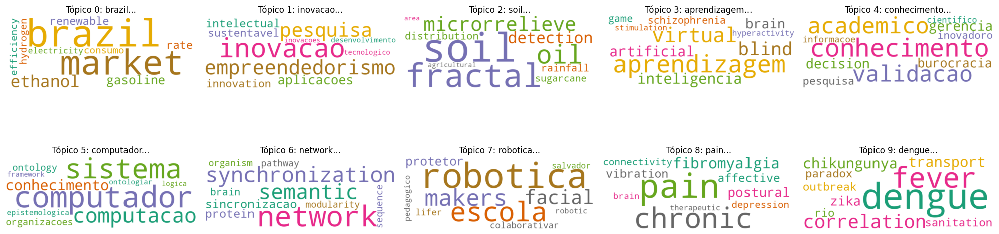

In [ ]:
import math
def generate_topic_wordclouds(topic_model, top_n_topics=6):
    """
    Gera um grid com nuvens de palavras para os N principais tópicos.
    """
    print(f"☁️ Gerando nuvens para os top {top_n_topics} tópicos...")

    # Pega a info dos tópicos (ignorando o -1 que é outlier)
    info_df = topic_model.get_topic_info()
    topics_to_plot = info_df[info_df['Topic'] != -1].head(top_n_topics)

    # Define o tamanho do grid (ex: 2 colunas)
    n_cols = 5
    n_rows = math.ceil(len(topics_to_plot) / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3.5 * n_rows))
    axes = axes.flatten() # Facilita iterar se for matriz

    # Configuração da Nuvem
    wc = WordCloud(
        background_color='white',
        width=800, height=300,
        max_words=10,
        colormap='Dark2' # Cores mais sóbrias
    )

    for i, (index, row) in enumerate(topics_to_plot.iterrows()):
        topic_id = row['Topic']

        # O BERTopic guarda a representação como uma lista de tuplas ou lista de strings
        # Vamos pegar direto do modelo para garantir os pesos (importante para o tamanho da letra)
        topic_words_dict = {word: score for word, score in topic_model.get_topic(topic_id)}

        # Gera a nuvem com base nos pesos (frequência)
        wc.generate_from_frequencies(topic_words_dict)

        # Plota no subplot correto
        axes[i].imshow(wc, interpolation="bilinear")
        axes[i].set_title(f"Tópico {topic_id}: {row['Name'].split('_')[1]}...", fontsize=12) # Tenta pegar a primeira palavra do nome
        axes[i].axis("off")

    # Esconde eixos vazios se houver
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# --- EXECUTAR ---
# Gera para os top 9 tópicos (ajuste o número conforme precisar)
# Use o modelo 'model_mmr' que é o melhor para essa analise
if 'model_mmr' in locals():
    generate_topic_wordclouds(model_mmr, top_n_topics=10)
else:
    print("⚠️ Modelo 'model_mmr' não encontrado. Certifique-se de ter treinado o modelo.")

#### DEPRECATED MAIN

In [ ]:
# ==============================================================================
# 1. INSTALAÇÃO DAS BIBLIOTECAS
# ==============================================================================
# Execute esta célula uma vez para instalar as dependências necessárias.
nltk.download('stopwords')
nltk.download('punkt')

def normalize_text(text):
    """Normaliza acentos e remove caracteres estranhos."""
    text = str(text).lower()
    text = unicodedata.normalize("NFKD", text)
    text = text.encode("ascii", "ignore").decode("utf-8")  # remove acentos
    text = re.sub(r"[^a-z\s]", " ", text)  # só letras
    text = re.sub(r"\s+", " ", text).strip()
    return text

def preprocess_text_bilingual(text):
    """
    Função completa para pré-processar texto em português e inglês,
    incluindo normalização, remoção de stopwords e lematização.
    """
    # Carregar modelos spaCy (uma vez)
    try:
        nlp_pt = spacy.load("pt_core_news_sm")
        nlp_en = spacy.load("en_core_web_sm")
    except OSError:
        print("Modelos spaCy não encontrados. Execute os comandos de download na célula anterior.")
        return ""

    # Stopwords
    stopwords_pt = set(stopwords.words('portuguese'))
    stopwords_en = set(stopwords.words('english'))

    if pd.isna(text) or text.strip() == "":
        return ""

    # Detectar língua
    try:
        lang = detect(text)
    except:
        lang = "pt"  # fallback para português

    # Normalizar texto (acentos, números, caracteres estranhos)
    text = normalize_text(text)

    # Selecionar modelo e stopwords com base na língua detectada
    if lang == 'en':
        doc = nlp_en(text)
        stopwords_set = stopwords_en
    else:
        doc = nlp_pt(text)
        stopwords_set = stopwords_pt

    # Tokenização, remoção de stopwords, siglas curtas e lematização
    tokens = []
    for token in doc:
        lemma = token.lemma_.lower().strip()

        # ignorar tokens muito curtos (1-2 letras), stopwords, pontuação ou espaços
        if (len(lemma) < 3 or
            lemma in stopwords_set or
            token.is_punct or
            token.is_space):
            continue

        tokens.append(lemma)

    # Remover duplicatas simples dentro do mesmo título
    tokens = list(dict.fromkeys(tokens))

    return " ".join(tokens)


def load_and_prepare_data(preprocess=True):
    """
    Carrega os dados brutos, aplica todo o pré-processamento na coluna 'title'
    e salva o resultado em um novo arquivo CSV.
    """
    raw_path = "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_database.csv"
    processed_path = "/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_processed_texts.csv"

    if preprocess:
        print("🔄 Carregando dados brutos e aplicando pré-processamento...")
        try:
            df = pd.read_csv(raw_path)
        except FileNotFoundError:
            print(f"ERRO: Arquivo '{raw_path}' não encontrado. Certifique-se de que ele está no mesmo diretório do seu notebook.")
            return None

        # Renomeia a coluna 'title' para 'title_original' para manter o original
        df = df.rename(columns={'title': 'title_original'})

        # Filtra linhas onde o título original é nulo ou vazio
        df = df[df['title_original'].notna() & (df['title_original'].str.strip().str.len() > 0)].reset_index(drop=True)

        # Remover títulos duplicados da coluna 'title_original'
        before = len(df)
        df = df.drop_duplicates(subset=['title_original']).reset_index(drop=True)
        print(f"🧹 Removidos {before - len(df)} títulos duplicados.")

        # Aplica a função de pré-processamento e salva na nova coluna 'title_processed'
        tqdm.pandas(desc="Pré-processando textos")
        df['title_processed'] = df['title_original'].progress_apply(preprocess_text_bilingual)

        # Remover linhas onde o texto processado ficou vazio
        df = df[df['title_processed'].notna() & (df['title_processed'].str.len() > 0)].reset_index(drop=True)

        # Salvar DataFrame completo (colunas originais + coluna processada)
        df.to_csv(processed_path, index=False)
        print(f"✅ Arquivo processado e salvo com sucesso em: '{processed_path}'")

    else:
        print(f"📂 Carregando CSV já pré-processado de '{processed_path}'...")
        try:
            df = pd.read_csv(processed_path)
        except FileNotFoundError:
            print(f"ERRO: Arquivo pré-processado '{processed_path}' não encontrado. Execute com preprocess=True primeiro.")
            return None

        # Garante que não há nulos na coluna processada
        df = df[df['title_processed'].notna()].reset_index(drop=True)

    return df

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


#### DEPRECATED Carregar e preparar dados

In [ ]:
# Carregar e preparar dados
df = load_and_prepare_data(False)

if df is not None:
    print("\n✅ Pré-processamento concluído! Amostra do resultado:")
    print(df[['title_original', 'title_processed']].head())

📂 Carregando CSV já pré-processado de '/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_processed_texts.csv'...

✅ Pré-processamento concluído! Amostra do resultado:
                                      title_original  \
0  Epidemiological Outbreaks Of Dengue, Chikungun...   
1  Saúde Pública: Prospecção Tecnológica Dos Regi...   
2  A Proposal For The Integration Of The Energy M...   
3  Indicações Geográficas E Suas Contribuições Pa...   
4          Innovation Management And Port Governance   

                                     title_processed  
0  epidemiological outbreak dengue chikungunya zi...  
1  saude publico prospeccao tecnologico de o regi...  
2  proposal integration energy matrix graph theor...  
3  indicacoes geografica contribuicoe politico pu...  
4              innovation management port governance  


#### DEPRECATED Treinar modelo

In [ ]:
topic_model, topics, probs, embeddings_array = train_model(df, False, False)

Batches:   0%|          | 0/11 [00:00<?, ?it/s]

### DEPRECATED Coerência (NPMI)

In [ ]:
# textos processados (lista de listas de tokens)
texts = df["title_processed"].apply(lambda x: x.split()).tolist()

# cria dicionário e corpus
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# extrai top words por tópico
topics = topic_model.get_topics()
top_words = [[word for word, _ in topic[:10]] for topic in topics.values()]

# calcula coerência NPMI
coherence_model = CoherenceModel(
    topics=top_words,
    texts=texts,
    dictionary=dictionary,
    coherence="c_npmi"
)
coherence_score = coherence_model.get_coherence()

print(f"Coerência (NPMI): {coherence_score:.4f}")


Coerência (NPMI): -0.2180


In [ ]:
# Seus textos processados (lista de tokens)
texts = [t.split() for t in df['title_processed'].tolist()]

# Obtém as palavras principais de cada tópico do BERTopic
topics = topic_model.get_topics()
topic_words = [
    [word for word, _ in words]
    for _, words in topics.items() if _ != -1
]

# Cria o dicionário e o corpus
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Calcula a coerência NPMI
coherence_model = CoherenceModel(
    topics=topic_words,
    texts=texts,
    dictionary=dictionary,
    coherence='c_npmi'
)
coherence_scores = coherence_model.get_coherence_per_topic()
avg_npmi = coherence_model.get_coherence()

print(f"Média NPMI: {avg_npmi:.4f}")

# Calcula a diversidade
def compute_topic_diversity(topic_words, top_n=10):
    all_words = [word for words in topic_words for word in words[:top_n]]
    unique_words = len(set(all_words))
    total_words = len(topic_words) * top_n
    return unique_words / total_words

topic_div = compute_topic_diversity(topic_words)
print(f"Diversidade de tópicos: {topic_div:.4f}")

# Exportar
coherence_df = pd.DataFrame({
    "Topic": list(range(len(coherence_scores))),
    "Coherence (NPMI)": coherence_scores
})

coherence_df.to_csv(
    "/content/drive/MyDrive/UNEB/TCC/Pipeline/coerencia_topicos.csv",
    index=False,
    encoding="utf-8-sig"
)
print("✅ Resultados exportados com sucesso.")


Média NPMI: -0.2095
Diversidade de tópicos: 0.9214
✅ Resultados exportados com sucesso.


### DEPRECATED Tabela Resumo

In [ ]:
# --- Extrai informações básicas do modelo ---
topics = topic_model.get_topic_info()

# Remove o tópico -1 (outliers) e pega os 10 principais
top_topics = topics[topics.Topic != -1].head(10)

# Função para pegar as N palavras principais de cada tópico
def top_words(topic_id, n=10):
    words = topic_model.get_topic(topic_id)
    if words is None:
        return ""
    return ", ".join([w for w, _ in words[:n]])

# Cria a coluna com as palavras principais
top_topics["Palavras Principais"] = top_topics["Topic"].apply(lambda x: top_words(x))

# Junta com os valores de coerência
summary = pd.merge(
    top_topics[["Topic", "Count", "Palavras Principais"]],
    coherence_df[["Topic", "Coherence (NPMI)"]],
    on="Topic",
    how="left"
)

# Renomeia as colunas
summary.columns = ["Tópico", "Qtd. Documentos", "Palavras Principais", "Coerência (NPMI)"]

# Ordena pelos tópicos mais representativos
summary = summary.sort_values("Qtd. Documentos", ascending=False).reset_index(drop=True)

# --- Exporta para CSV ---
output_path = "/content/drive/MyDrive/UNEB/TCC/Pipeline/tabela_topicos.csv"
summary.to_csv(output_path, index=False, encoding="utf-8-sig")

print(f"✅ Tabela resumo exportada com sucesso para:\n{output_path}")

# Mostra o resultado
summary.style.background_gradient(subset=["Coerência (NPMI)"], cmap="RdYlGn").set_properties(**{
    'text-align': 'left'
})

✅ Tabela resumo exportada com sucesso para:
/content/drive/MyDrive/UNEB/TCC/Pipeline/tabela_topicos.csv


,Tópico,Qtd. Documentos,Palavras Principais,Coerência (NPMI)
0,0,22,"soil, fractal, microrrelieve, distribution, rainfall, sugarcane, agricultural, area, openfoam, parameter",-0.305155
1,1,13,"pain, chronic, fibromyalgia, postural, vibration, affective, control, balance, depression, brain",-0.092304
2,2,12,"educacao, arquitetura, academico, informacoe, publico, fundamentar, graduacaor, ppsus, instituicoe, financiar",-0.426043
3,3,12,"robotica, educacional, escola, robotic, pedagogico, robo, inovador, ciencia, dynamic, piramide",-0.114539
4,4,12,"infection, amazonia, rainfall, correlation, brazilian, ibovespa, hospitalize, pandemic, endemic, demographic",-0.278485
5,5,12,"dengue, fever, correlation, chikungunya, transport, zika, sanitation, rio, paradox, outbreak",-0.038348
6,6,11,"software, programacao, sistema, reliability, integrar, installation, gpo, gerenciamento, hub, ccpm",-0.304406
7,7,11,"conductor, wavelet, fractal, dimension, laser, geometry, fragmentation, quality, variabilidade, rugosimetro",-0.279685
8,8,10,"limb, measurement, inertial, posturography, video, trajectory, survivor, segmentation, stroke, sensor",-0.164664
9,9,9,"social, colaborativo, cancer, vaccination, immune, participatory, cellular, leprosy, intergroup, pseudotuberculosis",-0.420028


### Distribuição de topicos (barras)

✅ Gráfico exportado com sucesso para:
/content/drive/MyDrive/UNEB/TCC/Pipeline/distribuicao_topicos.png


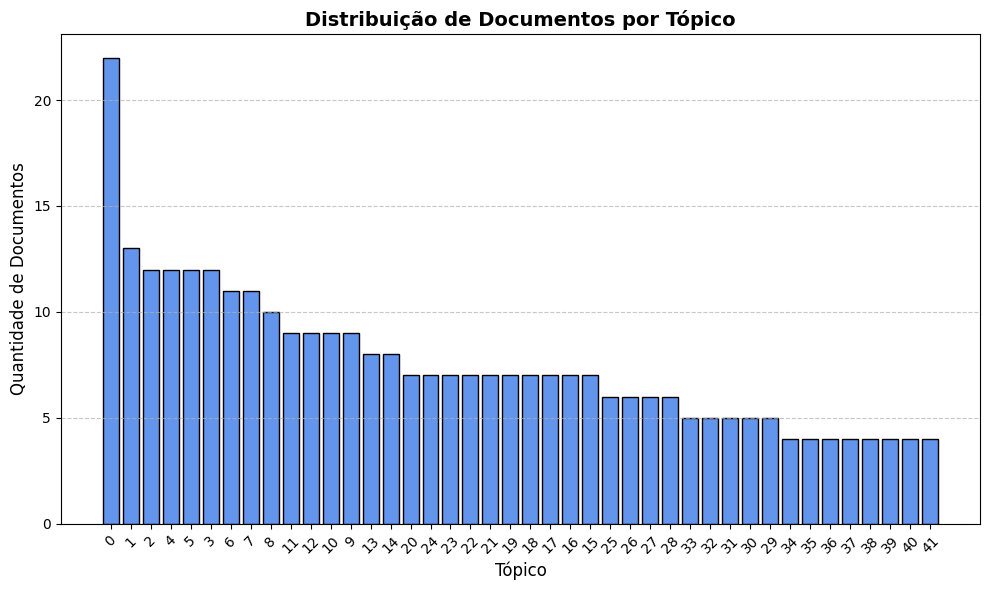

In [ ]:
# Caminho de saída
output_dir = "/content/drive/MyDrive/UNEB/TCC/Pipeline"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "distribuicao_topicos.png")

# Dados
topics = topic_model.get_topic_info()
topics = topics[topics.Topic != -1]
topics_sorted = topics.sort_values(by="Count", ascending=False)

# Gráfico
plt.figure(figsize=(10, 6))
plt.bar(topics_sorted["Topic"].astype(str), topics_sorted["Count"], color="cornflowerblue", edgecolor="black")

plt.title("Distribuição de Documentos por Tópico", fontsize=14, fontweight="bold")
plt.xlabel("Tópico", fontsize=12)
plt.ylabel("Quantidade de Documentos", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()

# Exporta
plt.savefig(output_path, dpi=300, bbox_inches="tight")

print(f"✅ Gráfico exportado com sucesso para:\n{output_path}")

plt.show()

✅ WordClouds exportados com sucesso para:
/content/drive/MyDrive/UNEB/TCC/Pipeline/wordcloud_topicos.png


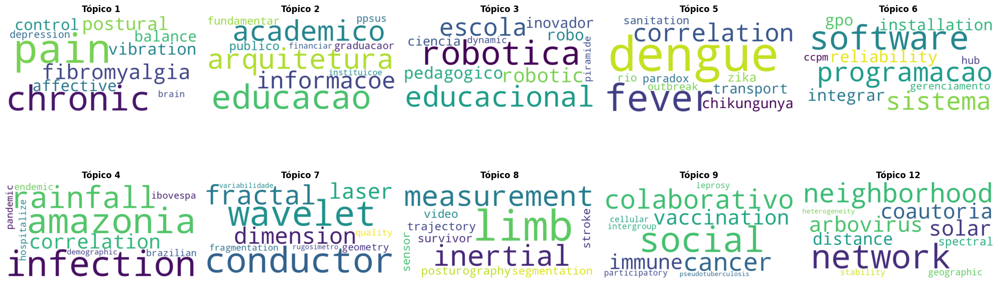

In [ ]:
# Caminho de saída
output_dir = "/content/drive/MyDrive/UNEB/TCC/Pipeline"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "wordcloud_topicos.png")

# Seleciona os 10 principais tópicos
topics = topic_model.get_topic_info()
topics = topics[topics.Topic != -1].sort_values("Count", ascending=False).head(10)

# Define layout
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, (topic_id, row) in enumerate(topics.iterrows()):
    # Obtém palavras e pesos do tópico
    words = dict(topic_model.get_topic(topic_id))

    # Gera a nuvem
    wc = WordCloud(
        width=800,
        height=400,
        background_color="white",
        colormap="viridis"
    ).generate_from_frequencies(words)

    axes[i].imshow(wc, interpolation="bilinear")
    axes[i].set_title(f"Tópico {topic_id}", fontsize=12, fontweight="bold")
    axes[i].axis("off")

# Remove eixos extras se houver
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.savefig(output_path, dpi=300, bbox_inches="tight")

print(f"✅ WordClouds exportados com sucesso para:\n{output_path}")


### Visualização de topicos

In [ ]:
# Gera o Mapa Interativo de Distância entre Tópicos
# Isso ajuda a ver se existem tópicos sobrepostos (que poderiam ser fundidos)
fig = model_mmr.visualize_topics()

# Ajustes visuais para ficar bonito no TCC (se for tirar print)
fig.update_layout(
    title={
        'text': "<b>Mapa de Distância Intertópicos (Intertopic Distance Map)</b>",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20)
    },
    width=1000,
    height=600,
    template="plotly_white" # Fundo branco é melhor para documentos acadêmicos
)

fig.show()

#### DEPRECATED NPMI por Tópico

✅ Gráfico de NPMI exportado com sucesso para:
/content/drive/MyDrive/UNEB/TCC/Pipeline/npmi_por_topico.png


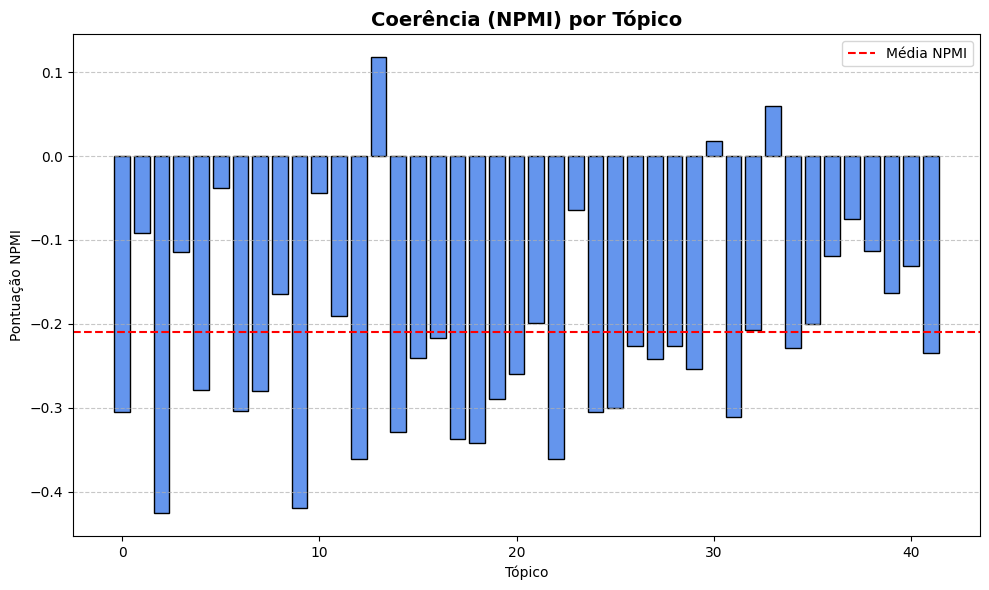

In [ ]:
# Garante o diretório de saída
output_dir = "/content/drive/MyDrive/UNEB/TCC/Pipeline"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "npmi_por_topico.png")

# --- Gráfico ---
plt.figure(figsize=(10, 6))
plt.bar(coherence_df["Topic"], coherence_df["Coherence (NPMI)"], color="cornflowerblue", edgecolor="black")
plt.title("Coerência (NPMI) por Tópico", fontsize=14, fontweight="bold")
plt.xlabel("Tópico")
plt.ylabel("Pontuação NPMI")
plt.axhline(y=coherence_df["Coherence (NPMI)"].mean(), color="red", linestyle="--", label="Média NPMI")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)

# --- Exportar ---
plt.tight_layout()
plt.savefig(output_path, dpi=300, bbox_inches="tight")

print(f"✅ Gráfico de NPMI exportado com sucesso para:\n{output_path}")

#### DEPRECATED Dataframe de topicos

In [ ]:
# --- Gerar DataFrame de artigos com tópicos ---
def map_topics_to_titles(df, topic_model, topics):
    # Coletar termos de cada tópico
    topic_info = {}
    for topic_id in set(topics):
        if topic_id == -1:  # Outliers
            topic_info[topic_id] = ["OUTLIER"]
        else:
            # Remover termos vazios
            terms = [term for term, _ in topic_model.get_topic(topic_id) if term.strip() != ""]
            topic_info[topic_id] = terms

    # Criar DataFrame com título, tópico e termos associados
    df_topics = pd.DataFrame({
        "title": df['title'],
        "topic": topics,
        "terms": [topic_info[t] for t in topics]
    })

    # Ordenar pelo tópico mais frequente
    topic_order = df_topics['topic'].value_counts().index
    df_topics = df_topics.set_index('topic').loc[topic_order].reset_index()

    return df_topics

# --- Exportar resultados ---
def export_topics(df_topics, path_csv="/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_topics.csv",
                  path_excel="/content/drive/MyDrive/UNEB/TCC/Pipeline/npai_topics.xlsx"):
    df_topics.to_csv(path_csv, index=False, encoding="utf-8-sig")
    df_topics.to_excel(path_excel, index=False)
    print(f"✅ Resultados exportados para:\n- {path_csv}\n- {path_excel}")


# --- Exibir resultados ---
def print_topic_titles_terms(df_topics):
    for topic_id in df_topics['topic'].unique():
        topic_terms = df_topics[df_topics['topic'] == topic_id]['terms'].iloc[0]
        topic_titles = df_topics[df_topics['topic'] == topic_id]['title'].tolist()
        print(f"\n📌 Tópico {topic_id} (Freq: {len(topic_titles)}) - Termos: {topic_terms}")
        for title in topic_titles:
            print(f"   - {title}")


# Exemplo de uso
df_topics = map_topics_to_titles(df, topic_model, topics)
print_topic_titles_terms(df_topics)
export_topics(df_topics)


#### DEPRECATED Projeção com UMAP manual

Embeddings loaded: (978, 384)
UMAP 2D projection: (978, 5)


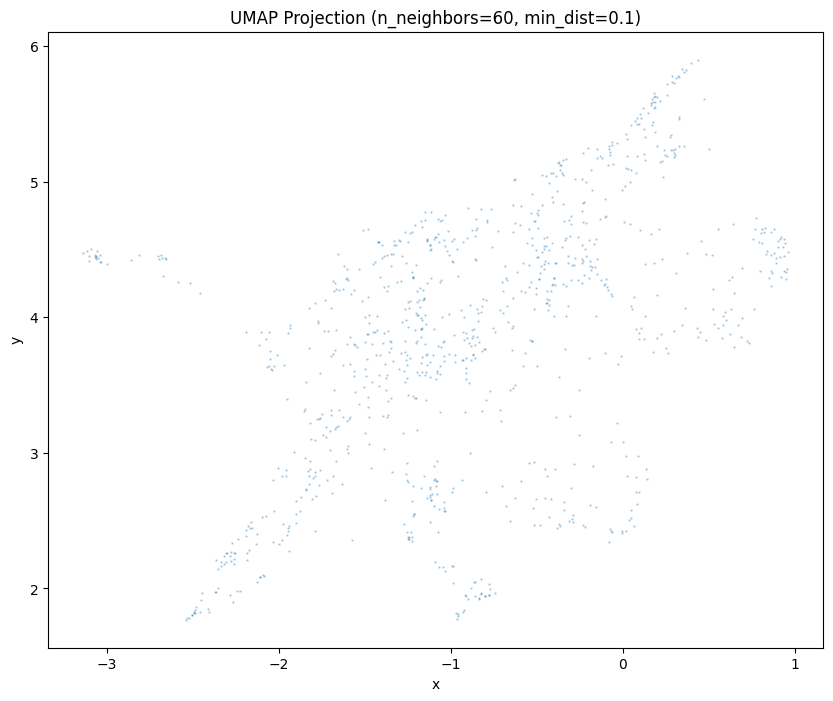

Saved projection to: /content/drive/MyDrive/UNEB/TCC/Pipeline/umap_projection.csv


In [ ]:
# === Configurações ===
SEED = 42
DATA_DIR = "/content/drive/MyDrive/UNEB/TCC/Pipeline"
n_neighbors = 60
min_dist = 0.1

# === Carrega os embeddings ===
embeddings_path = join(DATA_DIR, "npai_embeddings.npy")
embeddings = np.load(embeddings_path)
print("Embeddings loaded:", embeddings.shape)

# === Inicializa o UMAP ===
umap_model = umap.UMAP(
    n_neighbors=n_neighbors ,
    n_components=5,
    min_dist=min_dist,
    metric="cosine",
    random_state=SEED
)

# === Ajusta e transforma os embeddings ===
embeddings_2d = umap_model.fit_transform(embeddings)
print("UMAP 2D projection:", embeddings_2d.shape)

umap_df = pd.DataFrame({
    "x": embeddings_2d[:, 0],
    "y": embeddings_2d[:, 1],
    "title_original": df["title"],          # título sem pré-processar
    "title_processed": df["processed_text"],# título pré-processado
    "author": df["name"],                   # autores
    "source_type": df["source_table"]       # tipo de produção (origem)
})

# === Visualização simples ===
plt.figure(figsize=(10, 8))
plt.title(f"UMAP Projection (n_neighbors={n_neighbors}, min_dist={min_dist})")
plt.scatter(umap_df["x"], umap_df["y"], s=0.5, alpha=0.3)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

# === Salva o resultado ===
output_path = join(DATA_DIR, "umap_projection.csv")
umap_df.to_csv(output_path, index=False)
print("Saved projection to:", output_path)

In [ ]:
df

,title_original,year,publication_type,doi,language,periodical_magazine_name,qualis,issn,isbn,book_title,start_page,end_page,publishing_company,publishing_company_city,authors_list,title_processed
0,"Epidemiological Outbreaks Of Dengue, Chikungun...",2023,ARTICLE,10.53660/clm-2292-23r25,pt,Concilium (english Language Edition),A2,105236.0,NaN,NaN,NaN,NaN,NaN,NaN,"['Marcio Luis Valença Araújo', 'Hugo Saba Pere...",epidemiological outbreak dengue chikungunya zi...
1,Saúde Pública: Prospecção Tecnológica Dos Regi...,2022,ARTICLE,10.29327/265007.11.30-2,pt,International Journal Of Knowledge Engineering...,B1,23166517.0,NaN,NaN,NaN,NaN,NaN,NaN,"['Marcio Luis Valença Araújo', 'Hugo Saba Pere...",saude publico prospeccao tecnologico de o regi...
2,A Proposal For The Integration Of The Energy M...,2022,ARTICLE,10.31686/ijier.vol10.iss3.3683,pt,International Journal For Innovation Education...,C,24112933.0,NaN,NaN,NaN,NaN,NaN,NaN,"['Marcio Luis Valença Araújo', 'Hugo Saba Pere...",proposal integration energy matrix graph theor...
3,Indicações Geográficas E Suas Contribuições Pa...,2023,ARTICLE,10.7769/gesec.v14i9.2804,pt,Revista De Gestão E Secretariado,A4,21789010.0,NaN,NaN,NaN,NaN,NaN,NaN,['Marcio Luis Valença Araújo'],indicacoes geografica contribuicoe politico pu...
4,Innovation Management And Port Governance,2022,ARTICLE,10.31686/ijier.vol10.iss1.3616,en,International Journal For Innovation Education...,C,24112933.0,NaN,NaN,NaN,NaN,NaN,NaN,['Marcio Luis Valença Araújo'],innovation management port governance
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,Programação I,2012,BOOK,NaN,pt,NaN,NaN,NaN,999999999999X,NaN,NaN,NaN,NaN,NaN,['Eduardo Manuel de Freitas Jorge'],programacao
339,"Interfaces Entre Games, Pesquisa & Mercado",2016,BOOK,NaN,NaN,NaN,NaN,NaN,9788567562117,NaN,NaN,NaN,Edifba,Salvador,['Hugo Saba Pereira Cardoso'],interface game pesquisa mercado
340,Robótica Educacional: Revisão Sistemática E Ap...,2021,BOOK_CHAPTER,NaN,pt,NaN,NaN,NaN,NaN,Pesquisa Aplicada E Inovação - Volume 3,17.0,40.0,EDUFBA,Salvador,['Hugo Saba Pereira Cardoso'],robotica educacional revisao sistematico aplic...
341,Empreendedorismo E Inovação Em Saúde: Ciência ...,2018,BOOK,NaN,NaN,NaN,NaN,NaN,9788567562230,NaN,NaN,NaN,EDIFBA,Salvador,['Eduardo Manuel de Freitas Jorge'],empreendedorismo inovacao saude ciencia mercado


### Abordagem do wizmap com tooltip Title e Topic

Aqui removemos as stopwords "Title" e "Topic" para não entrar no mapeamento do wizmap

In [ ]:
def generate_essential_tooltips(df: pd.DataFrame) -> list:
    """Generate tooltip texts in the format: Title: "..."; Topic: "..."."""
    texts = []
    for _, row in df.iterrows():
        tooltip_text = f"Title: {row['title_original']}; Topic: {row['topic_name']}"
        texts.append(tooltip_text)
    return texts


# ==============================================================================
# --- Main Execution of the Visualization Pipeline ---
# ==============================================================================

# === Data Configuration and Loading ===
SEED = 42
DATA_DIR = "/content/drive/MyDrive/UNEB/TCC/Pipeline"
embeddings_path = join(DATA_DIR, "npai_embeddings.npy")
embeddings = np.load(embeddings_path)
print("Embeddings loaded:", embeddings.shape)

# --- 1. TOPIC LABEL PREPARATION AND ID MAPPING FOR WIZMAP ---
def clean_topic_name(name: str) -> str:
    """Remove numeric prefixes and replace underscores with spaces."""
    cleaned_name = re.sub(r'^-?\d+_', '', name)
    return cleaned_name.replace('_', ' ')

topic_info = topic_model.get_topic_info()
topic_info['Name'] = topic_info['Name'].apply(clean_topic_name)

# group_names = topic_info['Name'].tolist()
# id_map = {original_id: i for i, original_id in enumerate(topic_info['Topic'])}
# integer_labels = [id_map[t] for t in topics]


# --- 2. 2D PROJECTION AND NORMALIZATION ---
print("Performing 2D projection with UMAP...")
umap_model = topic_model.umap_model
embeddings_2d = umap_model.transform(embeddings)
xs = embeddings_2d[:, 0].astype(float)
ys = embeddings_2d[:, 1].astype(float)


# --- 3. FINAL DATAFRAME CONSTRUCTION AND TOOLTIP GENERATION ---
print("Building final DataFrame and generating tooltips...")

# Create base DataFrame with document coordinates
docs_df = pd.DataFrame({
    "x": xs,
    "y": ys,
    "topic_id": topics,
})

# Add metadata from the original DataFrame
docs_df = docs_df.join(df.reset_index(drop=True)[["title_original", "authors_list"]])

# Select topic-related columns from BERTopic and prepare for merge
topic_info_to_merge = topic_info.rename(columns={"Topic": "topic_id"})[[
    "topic_id",
    "Name",
    "Representation",
    "Representative_Docs"
]]
topic_info_to_merge = topic_info_to_merge.rename(columns={"Name": "topic_name"})

# Merge topic information with document data
bertopic_df = pd.merge(docs_df, topic_info_to_merge, on="topic_id")

# Reorder columns for better organization
column_order = [
    "topic_id",
    "topic_name",
    "Representation",
    "Representative_Docs",
    "title_original",
    "authors_list",
    "x",
    "y"
]
bertopic_df = bertopic_df[column_order]

# Generate tooltip texts
texts = generate_essential_tooltips(bertopic_df)


# --- 4. GENERATE AND SAVE WIZMAP FILES ---
print("Generating data files for WizMap...")

# Important: keep the original label order
data_list = wizmap.generate_data_list(
    bertopic_df["x"].tolist(),
    bertopic_df["y"].tolist(),
    texts
)

grid_dict = wizmap.generate_grid_dict(
    bertopic_df["x"].tolist(),
    bertopic_df["y"].tolist(),
    texts,
    "Academic Publications Map - NPAI",
    stop_words=["Title", "Topic"]
)

wizmap.save_json_files(
    data_list,
    grid_dict,
    output_dir=DATA_DIR,
    data_json_name="data_with_title_topic.ndjson",
    grid_json_name="grid_with_title_topic.json"
)
print(f"Data and grid files saved at {DATA_DIR}")


# --- 5. SAVE CONSOLIDATED DATAFRAME ---
final_csv_path = join(DATA_DIR, "bertopic_results_with_coords.csv")
bertopic_df.to_csv(final_csv_path, index=False)
print(f"Final DataFrame with results saved at: {final_csv_path}")

Embeddings loaded: (343, 384)
Performing 2D projection with UMAP...
Building final DataFrame and generating tooltips...
Generating data files for WizMap...
Start generating data list...
Start generating contours...
Start generating multi-level summaries...


343it [00:00, 160868.42it/s]
100%|██████████| 6/6 [00:00<00:00, 18.46it/s]


Data and grid files saved at /content/drive/MyDrive/UNEB/TCC/Pipeline
Final DataFrame with results saved at: /content/drive/MyDrive/UNEB/TCC/Pipeline/bertopic_results_with_coords.csv


### Grid Final Title + Topic

In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/f615a5adfca02e09ed332d2c03bf0a01883c39f5/data_with_title_topic.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/f615a5adfca02e09ed332d2c03bf0a01883c39f5/grid_with_title_topic.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/a118950f79c651d52ec329a141e2a4ea7ed35270/data_title_topic.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/a118950f79c651d52ec329a141e2a4ea7ed35270/grid_title_topic.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid teste 1


In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/86a196eafcebef6159f131605603d66d24997516/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/86a196eafcebef6159f131605603d66d24997516/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid teste 2

In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/17f278aa354a1f9b4d5e04d4ae3dd8a76fc5be6e/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/17f278aa354a1f9b4d5e04d4ae3dd8a76fc5be6e/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid teste 3


In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/875f303eca5dbe864548f80a1c8336993993ed24/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/875f303eca5dbe864548f80a1c8336993993ed24/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid teste 4

In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/fb923b00000b12adaa4a6bba5c4793a92a83a72a/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/fb923b00000b12adaa4a6bba5c4793a92a83a72a/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid teste 5

In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/d57184ba516fcea92d71ff2557f1bdb1e569e413/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/d57184ba516fcea92d71ff2557f1bdb1e569e413/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW

### Grid Teste 6


In [ ]:
data_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/e277c9d0bf85de1a4d090c1dcc9fcf08ace21358/data.ndjson"
)
grid_url = (
    "https://gist.githubusercontent.com/jeoaraujx/c9a610202e70139054c7e37eab937b93/raw/e277c9d0bf85de1a4d090c1dcc9fcf08ace21358/grid.json"
)
# Display wizmap
wizmap.visualize(data_url, grid_url, height=500)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgRmc9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBVZz0oZGksTixWbik9Pk4gaW4gZGk/RmcoZGksTix7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6Vm59KTpkaVtOXT1Wbjt2YXIgZHQ9KGRpLE4sVm4pPT4oVWcoZGksdHlwZW9mIE4hPSJzeW1ib2wiP04rIiI6TixWbiksVm4pO2Z1bmN0aW9uIGRpKCl7fWZ1bmN0aW9uIE4odCxlLGksbCxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTplLGxpbmU6aSxjb2x1bW46bCxjaGFyOm59fX1mdW5jdGlvbiBWbih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIFQwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gaWwodCl7dC5mb3JFYWNoKFZuKX1mdW5jdGlvbiBNMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gVW4odCxlKXtyZXR1cm4gdCE9dD9lPT1lOnQhPT1lfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWxldCBDbztmdW5jdGlvbiB3MCh0LGUpe3JldHVybiBDb3x8KENvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImEiKSksQ28uaHJlZj1lLHQ9PT1Dby5ocmVmfWZ1bmN0aW9uIGJHKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWNvbnN0IHB1PXR5cGVvZiB3aW5kb3c8InUiP3dpbmRvdzp0eXBlb2YgZ2xvYmFsVGhpczwidSI/Z2xvYmFsVGhpczpnbG9iYWw7ZnVuY3Rpb24gdjAodCxlKXt0LmFwcGVuZENoaWxkKGUpfWZ1bmN0aW9uIHhzKHQsZSxpKXtjb25zdCBsPW1HKHQpO2lmKCFsLmdldEVsZW1lbnRCeUlkKGUpKXtjb25zdCBuPUYoInN0eWxlIik7bi5pZD1lLG4udGV4dENvbnRlbnQ9aSxyRyhsLG4pfX1mdW5jdGlvbiBtRyh0KXtpZighdClyZXR1cm4gZG9jdW1lbnQ7Y29uc3QgZT10LmdldFJvb3ROb2RlP3QuZ2V0Um9vdE5vZGUoKTp0Lm93bmVyRG9jdW1lbnQ7cmV0dXJuIGUmJmUuaG9zdD9lOnQub3duZXJEb2N1bWVudH1mdW5jdGlvbiByRyh0LGUpe3JldHVybiB2MCh0LmhlYWR8fHQsZSksZS5zaGVldH1mdW5jdGlvbiBoRyh0LGUsaSl7dC5pbnNlcnRCZWZvcmUoZSxpfHxudWxsKX1mdW5jdGlvbiBrMCh0KXt0LnBhcmVudE5vZGUmJnQucGFyZW50Tm9kZS5yZW1vdmVDaGlsZCh0KX1mdW5jdGlvbiBKMCh0LGUpe2ZvcihsZXQgaT0wO2k8dC5sZW5ndGg7aSs9MSl0W2ldJiZ0W2ldLmQoZSl9ZnVuY3Rpb24gRih0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudCh0KX1mdW5jdGlvbiBadSh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyIsdCl9ZnVuY3Rpb24gRmUodCl7cmV0dXJuIGRvY3VtZW50LmNyZWF0ZVRleHROb2RlKHQpfWZ1bmN0aW9uIFl0KCl7cmV0dXJuIEZlKCIgIil9ZnVuY3Rpb24gUDAoKXtyZXR1cm4gRmUoIiIpfWZ1bmN0aW9uIHBHKHQsZSxpLGwpe3JldHVybiB0LmFkZEV2ZW50TGlzdGVuZXIoZSxpLGwpLCgpPT50LnJlbW92ZUV2ZW50TGlzdGVuZXIoZSxpLGwpfWZ1bmN0aW9uIFpHKHQsZSxpKXtpPT1udWxsP3QucmVtb3ZlQXR0cmlidXRlKGUpOnQuZ2V0QXR0cmlidXRlKGUpIT09aSYmdC5zZXRBdHRyaWJ1dGUoZSxpKX1mdW5jdGlvbiBHRyh0KXtyZXR1cm4gQXJyYXkuZnJvbSh0LmNoaWxkTm9kZXMpfWZ1bmN0aW9uIEtkKHQsZSl7dC52YWx1ZT1lPT1udWxsPyIiOmV9ZnVuY3Rpb24gaGUodCxlLGkpe3QuY2xhc3NMaXN0W2k/ImFkZCI6InJlbW92ZSJdKGUpfWZ1bmN0aW9uIFhHKHQsZSx7YnViYmxlczppPSExLGNhbmNlbGFibGU6bD0hMX09e30pe2NvbnN0IG49ZG9jdW1lbnQuY3JlYXRlRXZlbnQoIkN1c3RvbUV2ZW50Iik7cmV0dXJuIG4uaW5pdEN1c3RvbUV2ZW50KHQsaSxsLGUpLG59bGV0IFNzO2Z1bmN0aW9uIFZzKHQpe1NzPXR9ZnVuY3Rpb24gTjAoKXtpZighU3MpdGhyb3cgbmV3IEVycm9yKCJGdW5jdGlvbiBjYWxsZWQgb3V0c2lkZSBjb21wb25lbnQgaW5pdGlhbGl6YXRpb24iKTtyZXR1cm4gU3N9ZnVuY3Rpb24gZm4odCl7TjAoKS4kJC5vbl9tb3VudC5wdXNoKHQpfWZ1bmN0aW